In [ ]:
import pandas as pd 
import numpy as np

In [3]:
from sklearn.datasets import fetch_openml

mnist = fetch_openml('mnist_784', version=1)

In [6]:
mnist

{'data':        pixel1  pixel2  pixel3  pixel4  ...  pixel781  pixel782  pixel783  pixel784
 0           0       0       0       0  ...         0         0         0         0
 1           0       0       0       0  ...         0         0         0         0
 2           0       0       0       0  ...         0         0         0         0
 3           0       0       0       0  ...         0         0         0         0
 4           0       0       0       0  ...         0         0         0         0
 ...       ...     ...     ...     ...  ...       ...       ...       ...       ...
 69995       0       0       0       0  ...         0         0         0         0
 69996       0       0       0       0  ...         0         0         0         0
 69997       0       0       0       0  ...         0         0         0         0
 69998       0       0       0       0  ...         0         0         0         0
 69999       0       0       0       0  ...         0         0     

In [7]:
mnist.data.shape

(70000, 784)

In [9]:
import matplotlib.pyplot as plt 

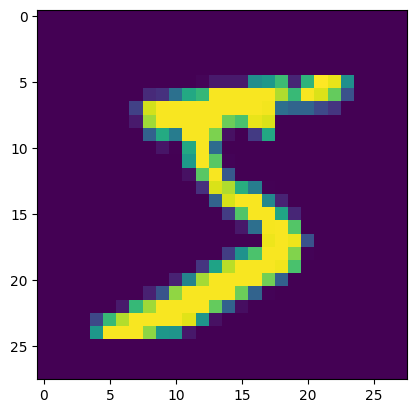

In [12]:
plt.imshow(mnist.data.iloc[0].values.reshape(28,28))

In [13]:
mnist.target[0]

'5'

In [17]:
X = mnist.data.iloc[:,1:].values # features
y = mnist.target # target

In [18]:
from sklearn.model_selection import train_test_split

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=42)

In [20]:
X_train.shape

(56000, 783)

In [21]:
X_test.shape

(14000, 783)

In [22]:
y_train.shape 

(56000,)

In [23]:
y_test.shape

(14000,)

### Random Forest Classifier

In [24]:
from sklearn.ensemble import RandomForestClassifier

In [25]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)


In [26]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [27]:
import time
start = time.time()
y_pred = rf.predict(X_test)
end = time.time()
print (end - start)

0.537097692489624


In [28]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.9676428571428571

### K neighbor Classifier

In [29]:
from sklearn.neighbors import KNeighborsClassifier

In [30]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [31]:
import time
start = time.time()
y_pred = knn.predict(X_test)
end = time.time()
print (end - start)

14.306706428527832


In [32]:
accuracy_score(y_test, y_pred)

0.9700714285714286

### PCA

In [33]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


In [34]:
scaler = StandardScaler()

In [35]:
pca = PCA(n_components=None)

In [36]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [41]:
X_train.shape
X_test.shape

(14000, 783)

In [37]:
X_train_transform = pca.fit_transform(X_train)
X_test_transform = pca.transform(X_test)

In [42]:
X_test_transform.shape

(14000, 783)

In [43]:
knn = KNeighborsClassifier(n_neighbors=5)

In [44]:
knn.fit(X_train_transform, y_train)

KNeighborsClassifier()

In [45]:
y_pred = knn.predict(X_test_transform)

In [46]:
accuracy_score(y_test, y_pred)

0.9457857142857143

In [87]:
for i in range (1, 200, 5):
    pca = PCA(n_components=i)
    X_train_transform = pca.fit_transform(X_train)
    X_test_transform = pca.transform(X_test)
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(X_train_transform, y_train)
    y_pred = knn.predict(X_test_transform)
    print(f'Accuracy with {i} components: {accuracy_score(y_test, y_pred)}')

Accuracy with 1 components: 0.25642857142857145
Accuracy with 6 components: 0.8270714285714286
Accuracy with 11 components: 0.9192142857142858
Accuracy with 16 components: 0.9436428571428571
Accuracy with 21 components: 0.9495714285714286
Accuracy with 26 components: 0.9508571428571428
Accuracy with 31 components: 0.9545714285714286
Accuracy with 36 components: 0.9575714285714285
Accuracy with 41 components: 0.9586428571428571
Accuracy with 46 components: 0.9597857142857142
Accuracy with 51 components: 0.9587857142857142
Accuracy with 56 components: 0.9596428571428571
Accuracy with 61 components: 0.9595714285714285
Accuracy with 66 components: 0.9597857142857142
Accuracy with 71 components: 0.9595714285714285
Accuracy with 76 components: 0.9587857142857142
Accuracy with 81 components: 0.9587142857142857
Accuracy with 86 components: 0.9587142857142857
Accuracy with 91 components: 0.9582142857142857
Accuracy with 96 components: 0.9590714285714286
Accuracy with 101 components: 0.958857142

In [67]:
pca = PCA(n_components=2)
X_train_transform = pca.fit_transform(X_train)
X_test_transform = pca.transform(X_test)

In [68]:
accuracy_score(y_pred, y_test)

0.9593571428571429

In [69]:
import plotly.express as px
y_train_transform = y_train.astype(int) # convert to int for plotly
fig = px.scatter(x=X_train_transform[:,0],
                 y=X_train_transform[:,1],
                 color=y_train_transform,
                 color_discrete_sequence=px.colors.qualitative.G10)
fig.update_layout(title='PCA of MNIST Dataset')
fig.show() 


In [74]:
pca = PCA(n_components=3)
X_train_transform = pca.fit_transform(X_train)
X_test_transform = pca.transform(X_test)

In [79]:
y_train_transform = y_train.astype(int) # convert to int for plotly
fig = px.scatter_3d(
                    x=X_train_transform[:,0],
                    y=X_train_transform[:,1],
                    z=X_train_transform[:,2],
                    color=y_train_transform,
                    color_discrete_sequence=px.colors.qualitative.G10,
                    title='PCA of MNIST Dataset in 3D',
                    )
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="white",
)
fig.show()

In [80]:
pca.explained_variance_

array([40.6329685 , 29.01311301, 26.91849535])

In [81]:
pca.components_.shape

(3, 783)

In [82]:
pca.explained_variance_ratio_

array([0.05674894, 0.04052038, 0.03759499])